### Import libaries and Data



In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import csv file

In [2]:
from google.colab import files
files.upload()

Saving Coffee_Shop.csv to Coffee_Shop (1).csv


{'Coffee_Shop (1).csv': b"transaction_id,transaction_date,transaction_time,transaction_qty,store_id,store_location,product_id,unit_price,product_category,product_type,product_detail\r\n1,1/1/2023,7:06:11,2,5,Lower Manhattan,32,3,Coffee,Gourmet brewed coffee,Ethiopia Rg\r\n2,1/1/2023,7:08:56,2,5,Lower Manhattan,57,3.1,Tea,Brewed Chai tea,Spicy Eye Opener Chai Lg\r\n3,1/1/2023,7:14:04,2,5,Lower Manhattan,59,4.5,Drinking Chocolate,Hot chocolate,Dark chocolate Lg\r\n4,1/1/2023,7:20:24,1,5,Lower Manhattan,22,2,Coffee,Drip coffee,Our Old Time Diner Blend Sm\r\n5,1/1/2023,7:22:41,2,5,Lower Manhattan,57,3.1,Tea,Brewed Chai tea,Spicy Eye Opener Chai Lg\r\n6,1/1/2023,7:22:41,1,5,Lower Manhattan,77,3,Bakery,Scone,Oatmeal Scone\r\n7,1/1/2023,7:25:49,1,5,Lower Manhattan,22,2,Coffee,Drip coffee,Our Old Time Diner Blend Sm\r\n8,1/1/2023,7:33:34,2,5,Lower Manhattan,28,2,Coffee,Gourmet brewed coffee,Columbian Medium Roast Sm\r\n9,1/1/2023,7:39:13,1,5,Lower Manhattan,39,4.25,Coffee,Barista Espresso,Latt

In [4]:
df = pd.read_csv('/content/Coffee_Shop.csv', index_col = 0, encoding='latin-1')
df.head(5)

,transaction_date,transaction_time,transaction_qty,store_id,store_location,product_id,unit_price,product_category,product_type,product_detail
transaction_id,,,,,,,,,,
1,1/1/2023,7:06:11,2,5,Lower Manhattan,32,3.0,Coffee,Gourmet brewed coffee,Ethiopia Rg
2,1/1/2023,7:08:56,2,5,Lower Manhattan,57,3.1,Tea,Brewed Chai tea,Spicy Eye Opener Chai Lg
3,1/1/2023,7:14:04,2,5,Lower Manhattan,59,4.5,Drinking Chocolate,Hot chocolate,Dark chocolate Lg
4,1/1/2023,7:20:24,1,5,Lower Manhattan,22,2.0,Coffee,Drip coffee,Our Old Time Diner Blend Sm
5,1/1/2023,7:22:41,2,5,Lower Manhattan,57,3.1,Tea,Brewed Chai tea,Spicy Eye Opener Chai Lg


### How have Maven Roasters sales trended over time?

In [6]:
df['total_sales'] = df['transaction_qty'] * df['unit_price']
df.head()

,transaction_date,transaction_time,transaction_qty,store_id,store_location,product_id,unit_price,product_category,product_type,product_detail,total_sales
transaction_id,,,,,,,,,,,
1,1/1/2023,7:06:11,2,5,Lower Manhattan,32,3.0,Coffee,Gourmet brewed coffee,Ethiopia Rg,6.0
2,1/1/2023,7:08:56,2,5,Lower Manhattan,57,3.1,Tea,Brewed Chai tea,Spicy Eye Opener Chai Lg,6.2
3,1/1/2023,7:14:04,2,5,Lower Manhattan,59,4.5,Drinking Chocolate,Hot chocolate,Dark chocolate Lg,9.0
4,1/1/2023,7:20:24,1,5,Lower Manhattan,22,2.0,Coffee,Drip coffee,Our Old Time Diner Blend Sm,2.0
5,1/1/2023,7:22:41,2,5,Lower Manhattan,57,3.1,Tea,Brewed Chai tea,Spicy Eye Opener Chai Lg,6.2


grown_rate : 203.83%
grown_rate_per_month : 33.97%


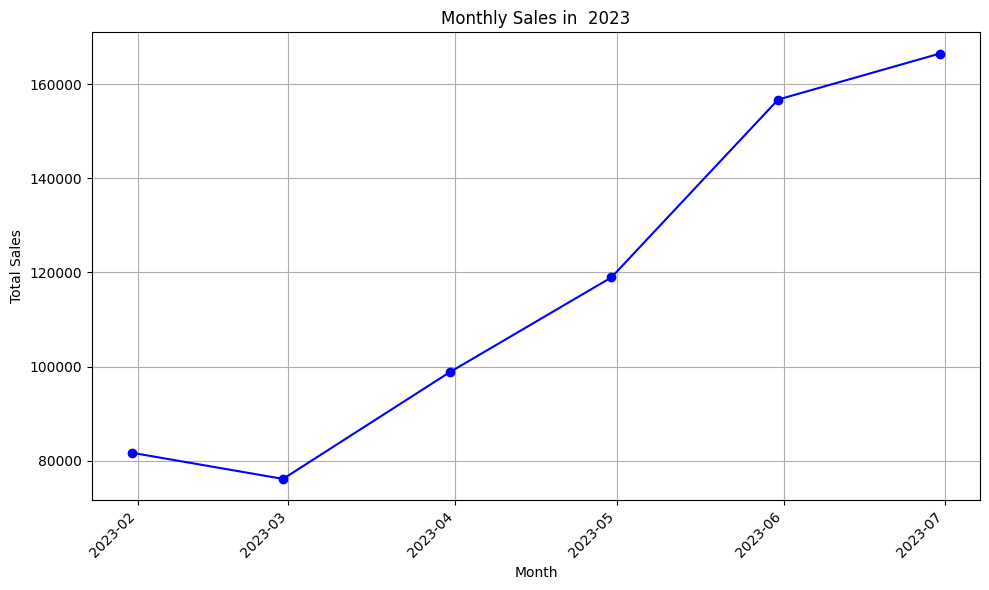

In [50]:
df['transaction_date'] = pd.to_datetime(df['transaction_date'])
monthly_sales = df.groupby(pd.Grouper(key='transaction_date', freq='M'))['total_sales'].sum().reset_index()
grown_rate = round(monthly_sales['total_sales'][5]*100/monthly_sales['total_sales'][0], 2)
grown_rate_per_m = round(grown_rate / 6, 2)

print('grown_rate : '+str(grown_rate)+'%')
print('grown_rate_per_month : '+str(grown_rate_per_m)+'%')

plt.figure(figsize=(10, 6))
plt.plot(monthly_sales.transaction_date, monthly_sales.total_sales, marker='o', linestyle='-', color='blue')

plt.xlabel('Month')
plt.ylabel('Total Sales')
plt.title('Monthly Sales in  2023')

plt.xticks(rotation=45, ha='right')

plt.grid(True)
plt.tight_layout()
plt.show()

Based on the revenue graph, there has been a significant overall increase in sales, rising by **203.83%** from the first month. On average, this translates to a **monthly growth rate of 33.97%**.

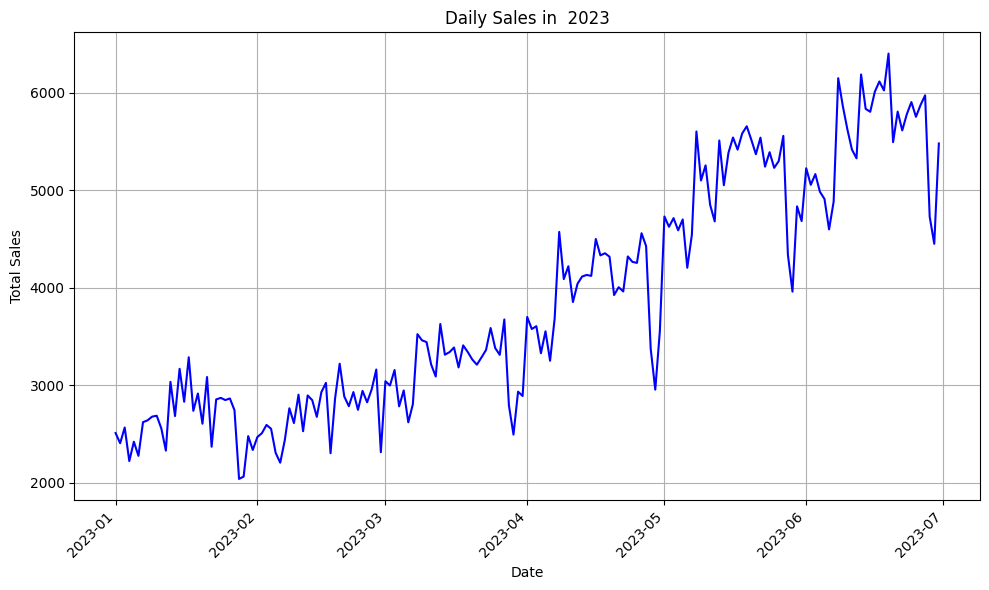

In [40]:
daily_sales = df.groupby('transaction_date')['total_sales'].sum()

plt.figure(figsize=(10, 6))
plt.plot(daily_sales.index, daily_sales.values, linestyle='-', color='blue')

plt.xlabel('Date')
plt.ylabel('Total Sales')
plt.title('Daily Sales in  2023')

plt.xticks(rotation=45, ha='right')

plt.grid(True)
plt.tight_layout()
plt.show()

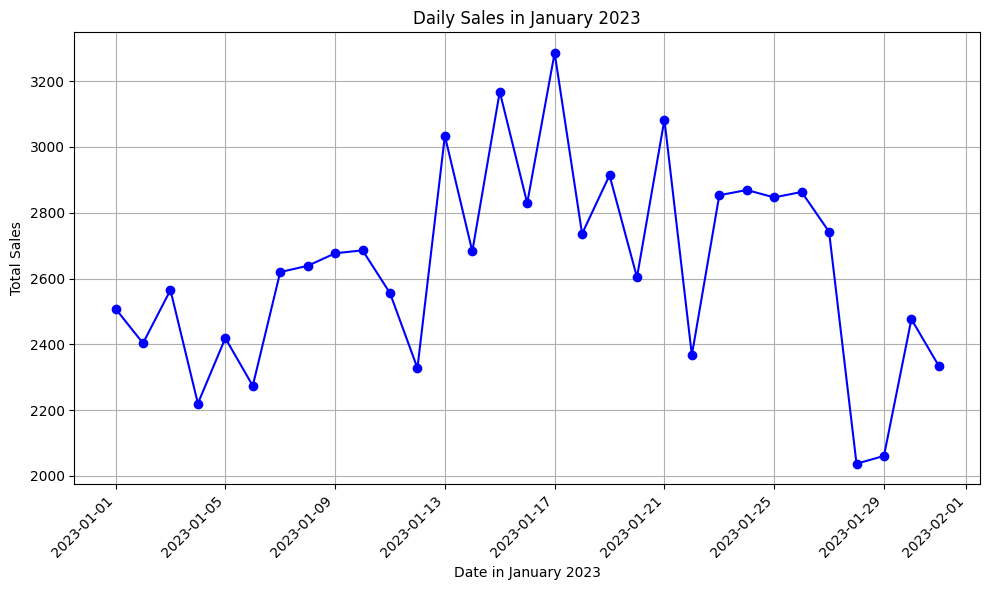

In [24]:
january_sales = df[df['transaction_date'].dt.month == 1].groupby('transaction_date')['total_sales'].sum()

plt.figure(figsize=(10, 6))
plt.plot(january_sales.index, january_sales.values, marker='o', linestyle='-', color='blue')

plt.xlabel('Date in January 2023')
plt.ylabel('Total Sales')
plt.title('Daily Sales in January 2023')

plt.xticks(rotation=45, ha='right')

plt.grid(True)
plt.tight_layout()
plt.show()


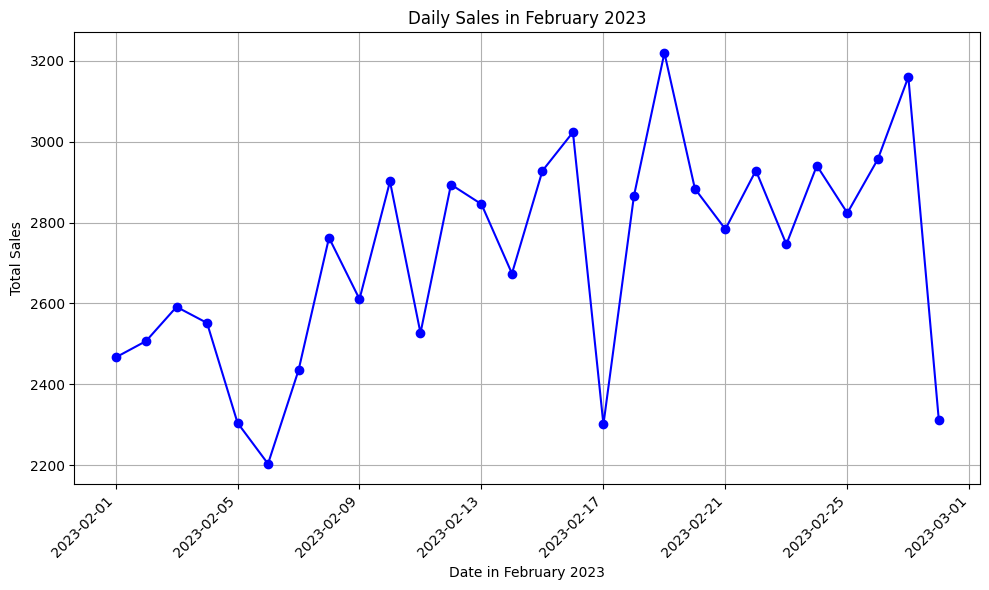

In [22]:
february_sales = df[df['transaction_date'].dt.month == 2].groupby('transaction_date')['total_sales'].sum()

plt.figure(figsize=(10, 6))
plt.plot(february_sales.index, february_sales.values, marker='o', linestyle='-', color='blue')

plt.xlabel('Date in February 2023')
plt.ylabel('Total Sales')
plt.title('Daily Sales in February 2023')

plt.xticks(rotation=45, ha='right')

plt.grid(True)
plt.tight_layout()
plt.show()

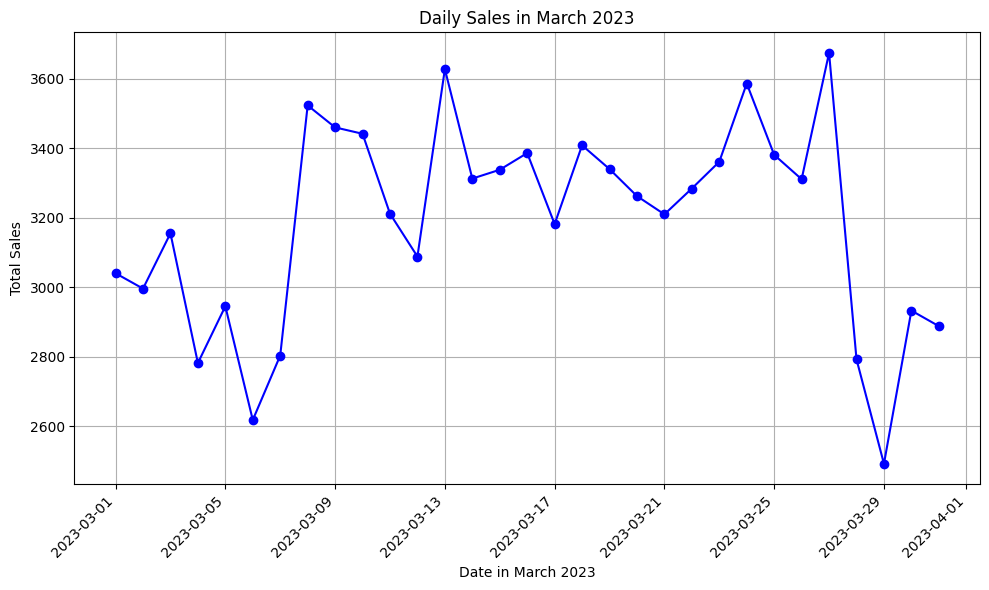

In [29]:
march_sales = df[df['transaction_date'].dt.month == 3].groupby('transaction_date')['total_sales'].sum()

plt.figure(figsize=(10, 6))
plt.plot(march_sales.index, march_sales.values, marker='o', linestyle='-', color='blue')

plt.xlabel('Date in March 2023')
plt.ylabel('Total Sales')
plt.title('Daily Sales in March 2023')

plt.xticks(rotation=45, ha='right')

plt.grid(True)
plt.tight_layout()
plt.show()

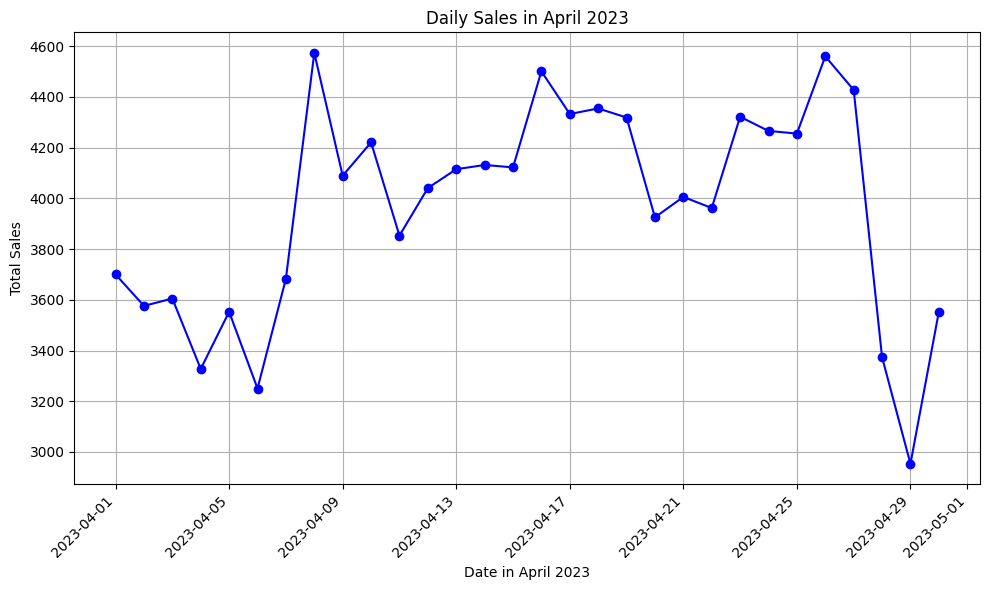

In [30]:
april_sales = df[df['transaction_date'].dt.month == 4].groupby('transaction_date')['total_sales'].sum()

plt.figure(figsize=(10, 6))
plt.plot(april_sales.index, april_sales.values, marker='o', linestyle='-', color='blue')

plt.xlabel('Date in April 2023')
plt.ylabel('Total Sales')
plt.title('Daily Sales in April 2023')

plt.xticks(rotation=45, ha='right')

plt.grid(True)
plt.tight_layout()
plt.show()

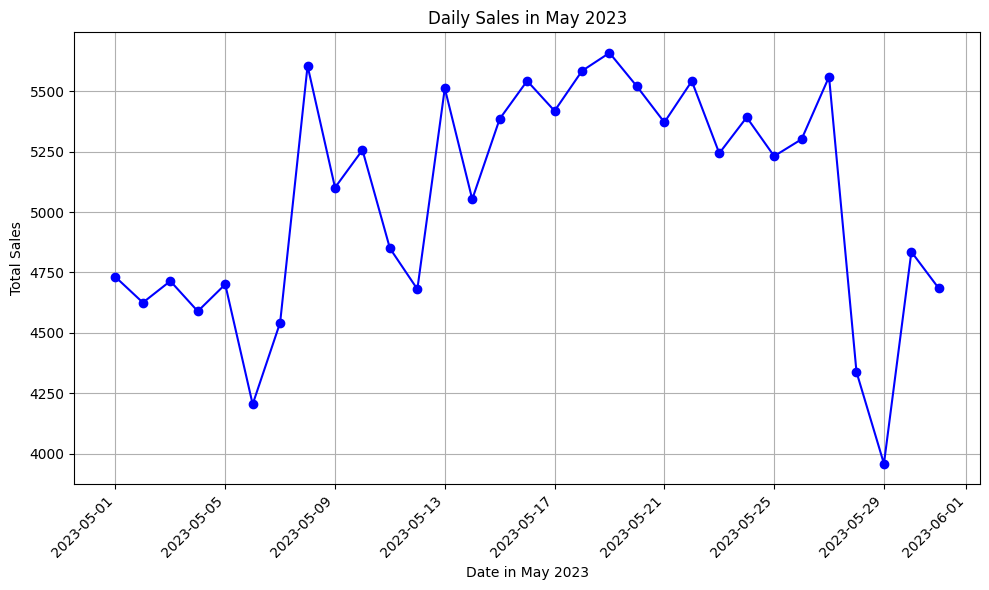

In [31]:
may_sales = df[df['transaction_date'].dt.month == 5].groupby('transaction_date')['total_sales'].sum()

plt.figure(figsize=(10, 6))
plt.plot(may_sales.index, may_sales.values, marker='o', linestyle='-', color='blue')

plt.xlabel('Date in May 2023')
plt.ylabel('Total Sales')
plt.title('Daily Sales in May 2023')

plt.xticks(rotation=45, ha='right')

plt.grid(True)
plt.tight_layout()
plt.show()

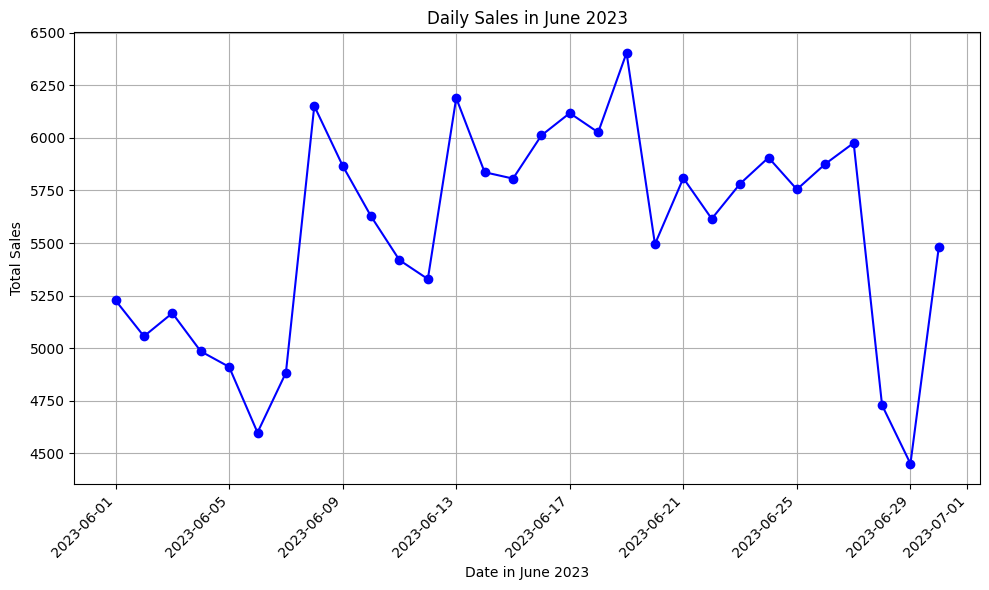

In [34]:
june_sales = df[df['transaction_date'].dt.month == 6].groupby('transaction_date')['total_sales'].sum()

plt.figure(figsize=(10, 6))
plt.plot(june_sales.index, june_sales.values, marker='o', linestyle='-', color='blue')

plt.xlabel('Date in June 2023')
plt.ylabel('Total Sales')
plt.title('Daily Sales in June 2023')

plt.xticks(rotation=45, ha='right')

plt.grid(True)
plt.tight_layout()
plt.show()

The 6-month sales graph reveals a pattern of lower sales during specific periods: the beginning of the month (around the 1st to 6th), mid-month (around the 11th to 13th), and the end of the month (around the 28th to 29th). To address this, it would be wise to investigate the reasons behind these dips and implement strategies like targeted promotions to boost customer engagement during these times.

### Which days of the week tend to be busiest, and why do you think that's the case?

In [15]:
df['day_of_week'] = df['transaction_date'].dt.day_name()

print(df[['transaction_qty', 'day_of_week']])

                transaction_qty day_of_week
transaction_id                             
1                             2      Sunday
2                             2      Sunday
3                             2      Sunday
4                             1      Sunday
5                             2      Sunday
...                         ...         ...
149452                        2      Friday
149453                        2      Friday
149454                        1      Friday
149455                        1      Friday
149456                        2      Friday

[149116 rows x 2 columns]


In [16]:
qty_by_day = df.groupby('day_of_week')['transaction_qty'].sum().reset_index()

ordered_days = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
qty_by_day['day_of_week'] = pd.Categorical(qty_by_day['day_of_week'], categories=ordered_days, ordered=True)
qty_by_day = qty_by_day.sort_values('day_of_week')

print(qty_by_day)

  day_of_week  transaction_qty
1      Monday            31231
5     Tuesday            30449
6   Wednesday            30625
4    Thursday            31162
0      Friday            31207
2    Saturday            29614
3      Sunday            30182


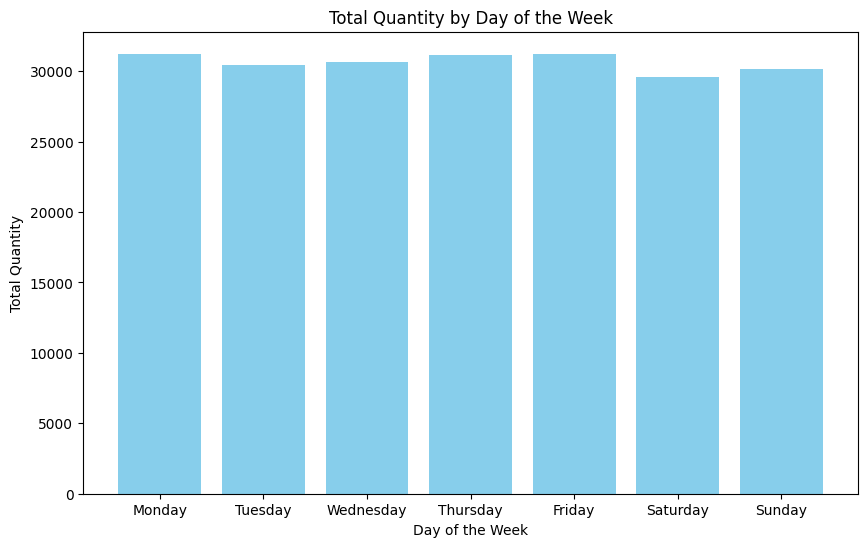

In [48]:
plt.figure(figsize=(10, 6))
plt.bar(qty_by_day['day_of_week'], qty_by_day['transaction_qty'], color='skyblue')

plt.xlabel('Day of the Week')
plt.ylabel('Total Quantity')
plt.title('Total Quantity by Day of the Week')

plt.show()


###Which products are sold most and least often? Which drive the most revenue for the business?

In [18]:
product_qty_sale = df.groupby('product_detail')['transaction_qty'].sum()

sorted_product_qty_sale_desc  = product_qty_sale.sort_values(ascending=False).head(5)
sorted_product_qty_sale_asc  = product_qty_sale.sort_values(ascending=True).head(5)

print(sorted_product_qty_sale_desc)
print(sorted_product_qty_sale_asc)

product_detail
Earl Grey Rg               4708
Dark chocolate Lg          4668
Morning Sunrise Chai Rg    4643
Latte                      4602
Peppermint Rg              4564
Name: transaction_qty, dtype: int64
product_detail
Dark chocolate                  118
Spicy Eye Opener Chai           122
Guatemalan Sustainably Grown    134
Earl Grey                       142
Jamacian Coffee River           146
Name: transaction_qty, dtype: int64


In [19]:
product_sales = df.groupby('product_detail')['total_sales'].sum()

sorted_product_sales_desc = product_sales.sort_values(ascending=False)

top_five_max = sorted_product_sales_desc.head(5)

print("Top Five Products with Maximum Sales:")
print(top_five_max)

print(product_sales)

Top Five Products with Maximum Sales:
product_detail
Sustainably Grown Organic Lg    21151.75
Dark chocolate Lg               21006.00
Latte Rg                        19112.25
Cappuccino Lg                   17641.75
Morning Sunrise Chai Lg         17384.00
Name: total_sales, dtype: float64
product_detail
Almond Croissant                 7168.13
Brazilian - Organic              3852.00
Brazilian Lg                    15109.50
Brazilian Rg                    13155.00
Brazilian Sm                     9482.00
                                  ...   
Sustainably Grown Organic Lg    21151.75
Sustainably Grown Organic Rg    16233.75
Traditional Blend Chai           1369.35
Traditional Blend Chai Lg       12522.00
Traditional Blend Chai Rg       11280.00
Name: total_sales, Length: 80, dtype: float64


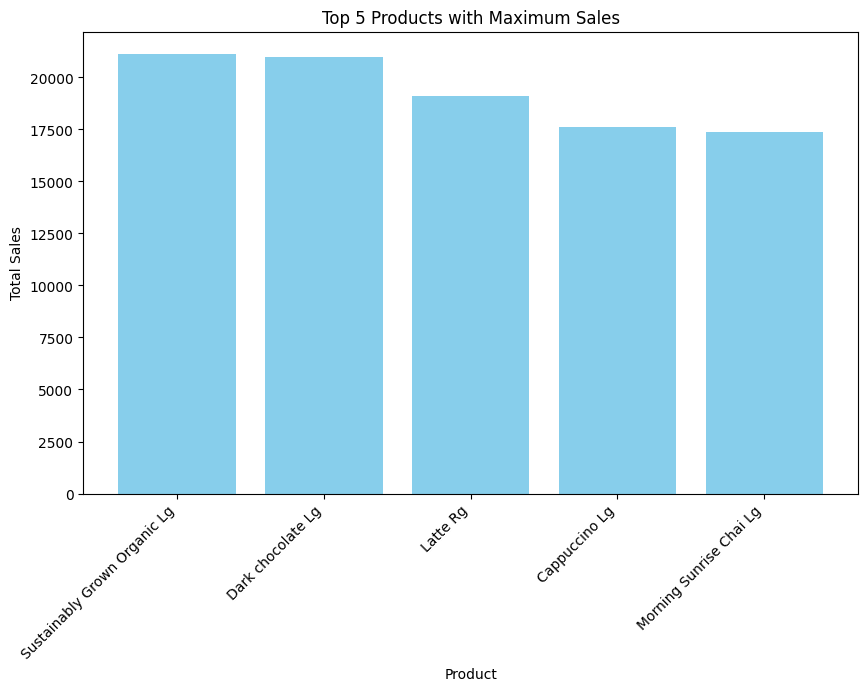

In [20]:
top_five_max= pd.DataFrame(data=top_five_max).reset_index()
top_five_max.columns = ['product_detail', 'total_sales']

plt.figure(figsize=(10, 6))
plt.bar(top_five_max['product_detail'], top_five_max['total_sales'], color='skyblue')

plt.xlabel('Product')
plt.ylabel('Total Sales')
plt.title('Top 5 Products with Maximum Sales')

plt.xticks(rotation=45, ha='right')

plt.show()